In [1]:
from keras import Input, layers, backend, Model, losses, datasets, models, metrics, optimizers, initializers
from keras.utils import Sequence
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:

class FelixSequence(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        """Here self.x is a list of paths to .npy input files. self.y is a
        corresponding list of paths to .npy output files."""
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        #print(np.array([np.load(file_name) for file_name in batch_x]).shape, np.array([np.load(file_name) for file_name in batch_y]).shape)
        return np.array([np.reshape(np.load(file_name), (128, 128, 1)) for file_name in batch_x]), np.array([np.reshape(np.load(file_name), (128, 128, 1)) for file_name in batch_y])
    

def gen_paths_labels(base_path = "D:\\Uni Work\\Masters Project\\electron_dists\\Data\\VAE_000_1\\Data"):
    """A generator to yield (data-paths, corresponding labels) tuples for each
    segment of data (typically training, validation, and testing)."""
    for segment in sorted(os.listdir(base_path)):
        segment_path = os.path.join(base_path, segment)
        input_paths = []
        output_paths = []
        for crystal in os.listdir(segment_path):
            crystal_path = os.path.join(segment_path, crystal)
            files = sorted(os.listdir(crystal_path))
            input_paths.append(os.path.join(crystal_path, files[0]))
            output_paths.append(os.path.join(crystal_path, files[1]))
        yield [input_paths, output_paths]

In [4]:
latent_dim = 10

"""
## Create a sampling layer
"""
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


In [5]:
"""
## Build the encoder
"""
encoder_inputs = Input(shape=(128, 128, 1))
x = layers.Conv2D(32, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
#x = layers.Dropout(0.25)(x) #APPARANTLY THEY ARE BAD
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var", kernel_initializer='zeros', bias_initializer='zeros')(x)
z = Sampling()([z_mean, z_log_var])
encoder = Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 64, 64, 32)   2080        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 32, 64)   131136      conv2d[0][0]                     
__________________________________________________________________________________________________
flatten (Flatten)               (None, 65536)        0           conv2d_1[0][0]                   
____________________________________________________________________________________________

In [6]:
"""
## Build the decoder
"""


latent_inputs = Input(shape=(latent_dim,))
x = layers.Dense(32 * 32 * 64, activation="relu")(latent_inputs)
#x = layers.Dropout(0.25)(x)
x = layers.Reshape((32, 32, 64))(x)
x = layers.Conv2DTranspose(128, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(64, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, kernel_size = (2, 2), activation="relu", padding="same")(x)
decoder = Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()


Model: "decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 10)]              0         
_________________________________________________________________
dense_1 (Dense)              (None, 65536)             720896    
_________________________________________________________________
reshape (Reshape)            (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 64, 64, 128)       524416    
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 128, 128, 64)      524352    
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 128, 128, 1)       257       
Total params: 1,769,921
Trainable params: 1,769,921
Non-trainable params: 0
_________________________________________________

In [3]:
class VAE(Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        x, y = data
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(x)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                losses.mean_squared_logarithmic_error(y, reconstruction), axis=(1, 2)
                )
            )
            #print(z_mean, z_log_var, z)
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

    def call(self, data):
        return self.decoder(self.encoder(data)[2])



In [7]:
vae = models.load_model("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_3")

#vae = VAE(encoder, decoder)
vae.compile(optimizer=optimizers.Adam())

batch_size=128
data_path = "/home/ug-ml/felix-ML/VAE_000/Data/Data"
data = [i for i in gen_paths_labels(data_path)]
val_seq = FelixSequence(data[2][0], data[2][1], batch_size)
train_seq = FelixSequence(data[1][0], data[1][1], batch_size)
test_seq = FelixSequence(data[0][0], data[0][1], batch_size)
#print(train_seq)
vae.fit(train_seq, shuffle=True, workers=16, epochs=3000)



Epoch 1/3000


ValueError: in user code:

    /home/ug-ml/felix-ML/env/lib/python3.6/site-packages/tensorflow/python/keras/engine/training.py:806 train_function  *
        return step_function(self, iterator)
    /home/ug-ml/felix-ML/env/lib/python3.6/site-packages/tensorflow/python/keras/engine/training.py:796 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    /home/ug-ml/felix-ML/env/lib/python3.6/site-packages/tensorflow/python/distribute/distribute_lib.py:1211 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    /home/ug-ml/felix-ML/env/lib/python3.6/site-packages/tensorflow/python/distribute/distribute_lib.py:2585 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    /home/ug-ml/felix-ML/env/lib/python3.6/site-packages/tensorflow/python/distribute/distribute_lib.py:2945 _call_for_each_replica
        return fn(*args, **kwargs)
    /home/ug-ml/felix-ML/env/lib/python3.6/site-packages/tensorflow/python/keras/engine/training.py:789 run_step  **
        outputs = model.train_step(data)
    /home/ug-ml/felix-ML/env/lib/python3.6/site-packages/tensorflow/python/keras/engine/training.py:757 train_step
        self.trainable_variables)
    /home/ug-ml/felix-ML/env/lib/python3.6/site-packages/tensorflow/python/keras/engine/training.py:2737 _minimize
        trainable_variables))
    /home/ug-ml/felix-ML/env/lib/python3.6/site-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:562 _aggregate_gradients
        filtered_grads_and_vars = _filter_grads(grads_and_vars)
    /home/ug-ml/felix-ML/env/lib/python3.6/site-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:1271 _filter_grads
        ([v.name for _, v in grads_and_vars],))

    ValueError: No gradients provided for any variable: ['conv2d_2/kernel:0', 'conv2d_2/bias:0', 'conv2d_3/kernel:0', 'conv2d_3/bias:0', 'dense_2/kernel:0', 'dense_2/bias:0', 'z_mean/kernel:0', 'z_mean/bias:0', 'z_log_var/kernel:0', 'z_log_var/bias:0', 'dense_3/kernel:0', 'dense_3/bias:0', 'conv2d_transpose_3/kernel:0', 'conv2d_transpose_3/bias:0', 'conv2d_transpose_4/kernel:0', 'conv2d_transpose_4/bias:0', 'conv2d_transpose_5/kernel:0', 'conv2d_transpose_5/bias:0'].


In [ ]:
vae.save("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_4")


In [8]:
#vae = models.load_model("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_3")

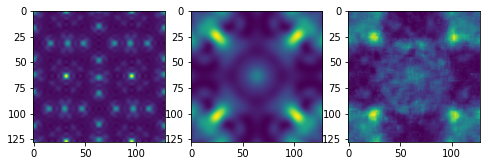

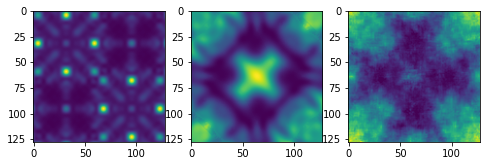

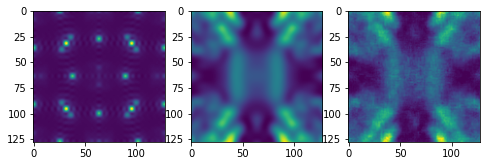

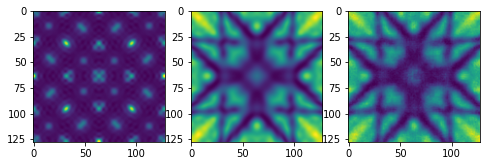

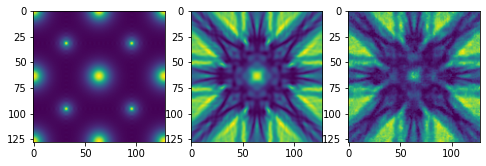

...

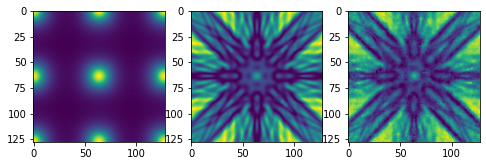

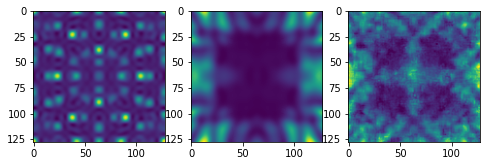

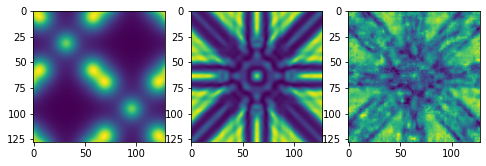

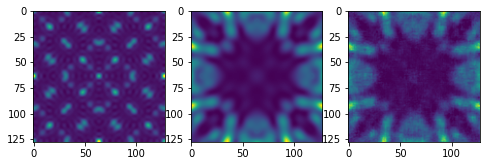

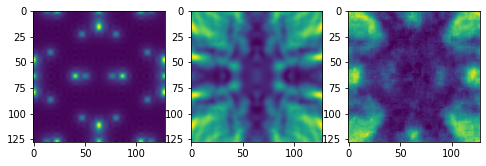

In [9]:
for i in range(100):
    x = np.load(data[0][0][i])
    y = np.load(data[0][1][i])
    a = np.reshape(vae(np.reshape(x, (1, 128, 128, 1))), (128, 128))


    w=10
    h=10
    fig=plt.figure(figsize=(8, 8))
    columns = 3
    rows = 1
    fig.add_subplot(rows, columns, 1)
    plt.imshow(x)
    fig.add_subplot(rows, columns, 2)
    plt.imshow(y)
    fig.add_subplot(rows, columns, 3)
    plt.imshow(a)
    plt.show()